In [6]:
using Pkg
Pkg.activate("../..")
using Plots, ForwardDiff, SymbolicNumericIntegration, SymPy
using LinearAlgebra, DifferentialEquations
include("../../julia_chaos/src/tools.jl")
using .ChaosTools

  Activating project at `~/Documents/STUDY/Bsc/ComplexSystems/julia-chaos`


## Intro

As we saw previously, the Lorenz attractor includes a variety of interesting phenomena, but maybe one of the most interesting ones its the ability to generate a infinite area while having the volume finite, via the use of **fractals**.

Probably you've heard about fractals before, these structures who reemerge at different scales, and are often used to generate images, like the amazing Mandelbrot set, or the Julia set which are one of the most beautiful visualizations of the complex plane. So let's dig into them:

## Sets

Starting from a very fuzzy idea, we can recall the [infinite hotel paradox](https://www.youtube.com/watch?v=Uj3_KqkI9Zo), the see that the idea of infinite is not so clear, and that we can have infinite sets, but not infinite objects, and some of those being much bigger than other infinite sets. This is the idea of **cardinality**, introduced by Georg Cantor.

![cantor](https://upload.wikimedia.org/wikipedia/commons/e/e7/Georg_Cantor2.jpg)


The main idea is that there exist different type of sets: the **countable** ones (like the natural numbers and there must be a homeomorphism between the set and $\mathbb{N}$), and the **uncountable** ones (like the real numbers).

In fact, in order to proof a set is countable you can try to create an strategy (i.e. algorithmic one) to enumerate all the elements of the set, and if you can't, then the set is uncountable.

This idea of sets allow us to think on the first fractal of this section, the **Cantor Set**, which is the simplest possible creation, where we will keep splitting a set in three parts, and removing the middle one, until we reach a certain level of detail. A way of looking at this is:

In [28]:
function cantor!(lines, start, len, idx)
    seg = div(len, 3)
    if seg > 0
        for i in idx+1:5, j in start + seg + 1: start + seg * 2
            lines[i, j] = ' '
        end
        cantor!(lines, start, seg, idx + 1)
        cantor!(lines, start + 2 * seg, seg, idx + 1)
    end
end

lines = fill(UInt8('.'), 5, 81)
cantor!(lines, 0, 81, 1)

for i in 1:5, j in 1:81
    print(Char(lines[i, j]), j == 81 ? "\n" : "")
end

.................................................................................
...........................                           ...........................
.........         .........                           .........         .........
...   ...         ...   ...                           ...   ...         ...   ...
. .   . .         . .   . .                           . .   . .         . .   . .


This example exhibits some general characteristics of fractals, like:

- **Scale invariance structure**: the structure is the same at all scales.
- **Self-similarity**: It contains sub-copies of itself at different scales.

### Dimension

The dimension of a fractal is a measure of its complexity. In a more pregmatical manner, we can use the definition given by Strogatz: 

> The fractal dimension of a set is the number of coordinates needed to specify a point in the set.

Now lets use this idea to extrapolate to the von Koch curve:


┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/01.gif
└ @ Plots /home/jose/.julia/packages/Plots/nuwp4/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/01.gif")
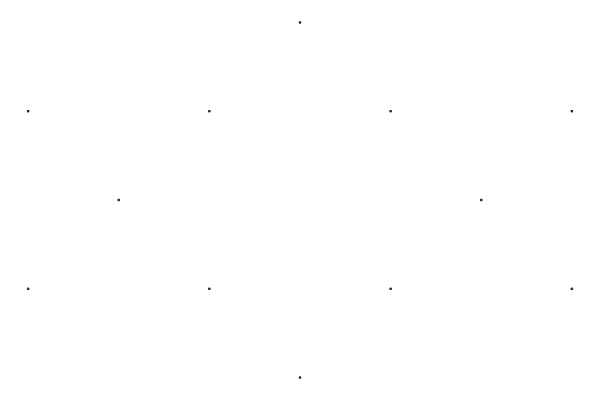

In [14]:
function koch_snowflake(base1,base2,base3,n,arr)
    if n==0
        return
    else
        midpoint=get_datapoint(base1,base2,euclidean_distance(base1,base2)/2)
        triangle_top=get_datapoint(midpoint,base3,
                                   euclidean_distance(midpoint,base3)/3,
                                   "outer")
        segment1=get_datapoint(base1,base2,euclidean_distance(base1,base2)/3)
        segment2=get_datapoint(base2,base1,euclidean_distance(base1,base2)/3)
        segment_side_1=get_datapoint(base1,base3,euclidean_distance(base1,base3)/3)
        segment_side_2=get_datapoint(base2,base3,euclidean_distance(base2,base3)/3)
        append!(arr,[segment1,segment2,triangle_top])
        koch_snowflake(base1,segment1,segment_side_1,n-1,arr)
        koch_snowflake(segment1,triangle_top,segment2,n-1,arr)
        koch_snowflake(triangle_top,segment2,segment1,n-1,arr)
        koch_snowflake(segment2,base2,segment_side_2,n-1,arr)
    end
    arr
end

anim = @animate for n in 1:5
    point1=(0.0,0.0)
    point2=(3.0,0.0)
    point3=(1.5,1.5*√(n))
    coordinates=[point1,point2,point3]
    append!(coordinates,koch_snowflake(point1,point2,point3,n,[]))
    append!(coordinates,koch_snowflake(point3,point1,point2,n,[]))
    append!(coordinates,koch_snowflake(point2,point3,point1,n,[]));
    scatter([i[1] for i in coordinates], [i[2] for i in coordinates], markersize=1, legend=false,showaxis=false,ticks=false,grid=false)
end
gif(anim, "01.gif", fps = 2)

Clearly we ran into a problem here because besides the fact that the curve is not closed, we can't use the definition of dimension because we can't specify a point in the curve with only one coordinate, but we need infinite because at large $n$ we start getting an effective infinite length of the curve.

So we need a metric to improve our definition, the most simple one is the **similarity metric** $d$:

$$m = r^d \rightarrow d = \frac{\ln m}{\ln r}$$

Where $r$ is the normalization factor needed when we get $m$ self similar copies of the curve, and $d$ is the dimension of the curve.

For example, in the case of the Kosh snowflake, we have $m = 3$ and $r = 4$, so we get $d = \frac{\ln 3}{\ln 4}$.

However, we have restricted ourself to a simple case con self similar maps, but in fact one could get fractals whose recursive relation varies over the iterations. So one could extend the definition to more general cantor sets, which in general are called by the fancy mathematicians **topological Cantor-like sets**, and are defined as the ones that obey the following conditions:

- They are totally disconnected (you cannot create a subset of the set that is connected).
- There are no isolated points (every point is connected to at least one other point up to a distance $\epsilon$).

### Box-counting dimension

As also the concept of  **similarity metric** is not very rigorous for not self repeating fractals, we can use the **box-counting dimension** which is defined by introducing a scale of measurement $\epsilon$, and counting the number of boxes of a certain size that are needed to cover the fractal. A proper definition is:

> If the fractal is defined by a set $S$ in a Euclidean Space $\mathbb{R}^n$, and you need $N(\epsilon)$ boxes of size $\epsilon$ to cover the fractal, then the box-counting dimension is defined as:
>
> $$d = \lim_{\epsilon \rightarrow 0} \frac{\ln( N(\epsilon))}{\ln(1/\epsilon)}$$

As you might imagine, you first need to find a scale $\epsilon$ that is small enough to cover the fractal, and then you need to find a way to count the number of boxes of size $\epsilon$ that are needed to cover the fractal. This is usually done by using a **grid** of size $\epsilon$ and counting the number of boxes that are covered by the fractal, but it is not very straight.

Therefore, other approaches to estimating the dimension have been proposed, see for example the [Hausdorff dimension](https://en.wikipedia.org/wiki/Hausdorff_dimension), which is defined as the dimension of the set of points that are at a distance $\epsilon$ from the fractal.

### Pointwise dimension

We have spent quite some time talking about how fractals appear in the study the dynamics, so lets go for a twistplot... search for the dimension of the fractal by looking at the dynamical system that generates it. This is the idea of the **pointwise dimension**.

The idea is the following: get the a point $\vec{x}$ located in the phase plane of a strange attractor. The, create a N-dimensional sphere of radius $\epsilon$ centered in $\vec{x}$, and count the number of points that are inside the sphere. Then, you can estimate the dimension of the attractor by increasing $\epsilon$ and counting the number of points inside the sphere as a function of $\epsilon$: 

$$N(\epsilon, x) = \epsilon^d$$

But how to select the center $\vec{x}$? Well, you can select it randomly in the domain of the attractor a few hundreds of times, and then average the results... Not very elegant, but it works, and gives us what is called the **correlation dimension**:

$$C(\epsilon) = \epsilon^d$$



## Strange Attractors

It is time now to turn into a deeper study of chaotic system using a different approach, the one of the strange attractors. 

Strange attractors are a different type of beast from any other dynamical system because besides they are confined to a volume, they don't have a fixed point and closer trajectories diverge exponentially. We model all of them using what we call **stretching and folding maps**.

The intuition is exactly the same as if you were doing a Croissant, you start with a circle, and then you stretch it and fold it, and then you stretch it and fold it, and so on, and so on, and so on... until you get a nice croissant.

![gif](https://fannyzanotti.com/wp-content/uploads/2016/05/tour-double-fanny.gif)

This process is commonly known as a horsehoe map. And following similar ideas, one can get a intuition of the dissipation of nested maps, which says if the volumes (the N-dimesnional ones) of the maps are decreasing in each iteration. And in fact, is a very important property because if there is a invariance of the area, then the system cannot contain attractors.

### Henon map

Henon was a guy who was interested in the dynamics of the Lorenz attractor, but he aimed at a very intelligent idea: instead of using the proper system, why not to reduce it to one with higher dissipation:

$$x_{n+1} = 1 - ax_n^2 + y_n, \ \ \ \ y_{n+1} = bx_n$$

It was designed to also behave in a special way:

- There is a way of inverting the map, so each point can come only from a single past state.
- The areas are uniformly contracting among the parameter space.
- There exists a combination of parametes $a$ and $b$ that generates a strange attractor.
- Some trajectories simply diverge.

Now to play around a bit, it becomes necessary to be intelligent in the selection of the parameters...

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/02.gif
└ @ Plots /home/jose/.julia/packages/Plots/nuwp4/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/02.gif")
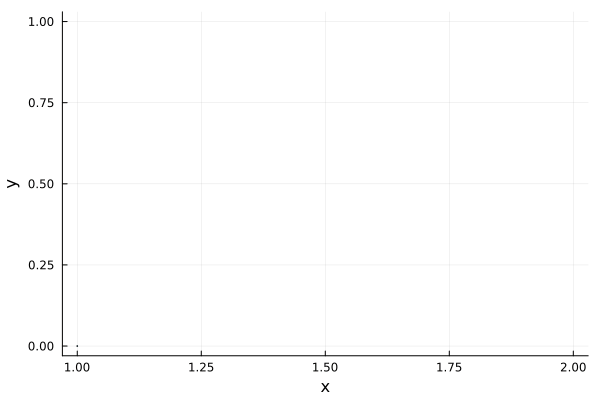

In [17]:
a = 1.4
b = 0.3
function henon_map(x, y)
    (1-a*x^2 + y), (b*x)
end
xs = ones(2000); ys = zeros(2000)
Plots.plot(xlabel="x", ylabel="y", legend=false, )
anim = @animate for n in 2:2000-1
    x, y = henon_map(xs[n], ys[n])
    xs[n+1] = x; ys[n+1] = y
    Plots.scatter!([xs[n]], [ys[n]], markersize=0.5, label="")
end
gif(anim, "02.gif")

### Rössler system

Going back again to differential equations, we can get a very interesting system that is very similar to the Lorenz system, but with a simpler dynamics coming from only a single non linear term:

$$\dot{x} = -y - z, \ \ \ \ \dot{y} = x + ay, \ \ \ \ \dot{z} = b + z(x - c)$$

Here, by taking the parameters $a = 0.2, b = 0.2, c = 5.7$ we get a strange attractor, which pretty much repeats the baker map, *stretching, folding and re-injecting*.

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/03.gif
└ @ Plots /home/jose/.julia/packages/Plots/nuwp4/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/03.gif")
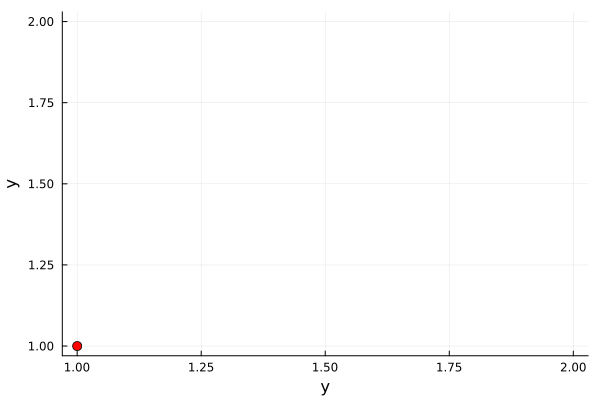

In [23]:
function rossler(du, u, p, t)
    x, y, z = u
    a, b, c = p
    du[1] = -y - z
    du[2] = x + a*y
    du[3] = b + z*(x - c)
end
u0 = [1.0, 1.0, 1.0]
tspan = (0.0, 300.0)
p = (0.2, 0.2, 5.7)

prob = ODEProblem(rossler, u0, tspan, p)
ts = 0:0.05:300
sol = solve(prob, Tsit5(), saveat=ts);
anim = @animate for i in 1:Integer(300/0.05)
    Plots.plot([s[1] for s in sol.u[1:i]], [s[2] for s in sol.u[1:i]], ylabel="y", xlabel="y", label="")
    Plots.scatter!([sol.u[i][1]], [sol.u[i][2]], label="", color=:red, markersize=5)
end
gif(anim, "03.gif", fps=40)

So we get a system whose re-injection occurs without any intersection of lines. A better way to see this is to plot the phase space of the system, and see how the trajectories are distributed in the 3D space:

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/04.gif
└ @ Plots /home/jose/.julia/packages/Plots/nuwp4/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/julia-chaos/entries/03_three_chaos/04.gif")
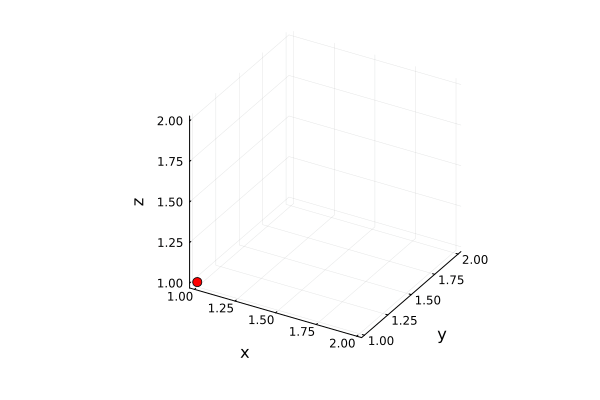

In [27]:
anim = @animate for i in 1:Integer(300/0.05)
    Plots.plot([s[1] for s in sol.u[1:i]], [s[2] for s in sol.u[1:i]], [s[3] for s in sol.u[1:i]], ylabel="y", xlabel="x", zlabel="z", label="")
    Plots.scatter!([sol.u[i][1]], [sol.u[i][2]], [sol.u[i][3]], label="", color=:red, markersize=5)
end
gif(anim, "04.gif", fps=50)

## Conclusion

In this blog we have covered the basics of fractals in with their scale invariance and self similarity. We talked briefly about the idea od cardinality in a set and how that idea extrapolates directly to the dimensionality of a set. Talking about this, we commented on a few ways to estimate the dimension of a fractal:

- Similarity metric: Log percentage of magnification over reescaling.
- Box-counting dimension: Density of the final states of the system.

Then, we went back to the idea of strange attractors, and we saw how they are generated by a stretching and folding map, and how the Rössler system is a good example of this. We also saw how the phase space of the system is distributed in the 3D space, and how the trajectories are distributed in the 3D space.

Really interesting stuff, and I hope you enjoyed it. I will be back soon with more stuff!

**Reference**: [*Nonlinear Dynamics and Chaos*](https://www.stevenstrogatz.com/books/nonlinear-dynamics-and-chaos-with-applications-to-physics-biology-chemistry-and-engineering), by Steven Strogatz.